<a href="https://colab.research.google.com/github/bellacitrine/minji/blob/minji/calinski_harabasz_score2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.cluster import KMeans

In [2]:
df = pd.read_csv('/content/units_tiers_and_comb.csv')

In [3]:
df.shape

(9288, 70)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9288 entries, 0 to 9287
Data columns (total 70 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gameId         9288 non-null   object 
 1   game_datetime  9288 non-null   int64  
 2   game_length    9288 non-null   float64
 3   game_version   9288 non-null   object 
 4   puuid          9288 non-null   object 
 5   placement      9288 non-null   int64  
 6   last_round     9288 non-null   int64  
 7   level          9288 non-null   int64  
 8   시비르            9288 non-null   int64  
 9   리븐             9288 non-null   int64  
 10  쉔              9288 non-null   int64  
 11  탐 켄치           9288 non-null   int64  
 12  갈리오            9288 non-null   int64  
 13  카이사            9288 non-null   int64  
 14  사일러스           9288 non-null   int64  
 15  우디르            9288 non-null   int64  
 16  케일             9288 non-null   int64  
 17  케이틀린           9288 non-null   int64  
 18  렉사이     

In [5]:
df.head(9288)

,gameId,game_datetime,game_length,game_version,puuid,placement,last_round,level,시비르,리븐,...,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야,Combination
0,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,BWLn3nfAuki-3ju22n-ni5exBESPlXaPsyF9bZ3uFeuvr1...,7,28,8,2,2,...,0,0,0,0,0,0,0,0,0,"TFT11_Sivir, TFT11_Riven, TFT11_Shen, TFT11_Ta..."
1,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,mptEuTzeZ2MWsLxe4KfwLTr2iJp2uUphE7maw8CwGfeeFK...,1,40,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Caitlyn, TFT11_RekSai, TFT11_Jax, TFT11_..."
2,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,iM__viRIlCBc3VBF9p0BK9a58MsQTrB6Svi4asmtcw4vxk...,4,34,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Udyr, TFT11_Ornn, TFT11_Azir, TFT11_Jann..."
3,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,XwRIqTXBnBYgAU3Jct9FIDtrIOy01HBn4PUM6BecUex8D2...,8,27,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_TahmKench, TFT11_Sylas, TFT11_Udyr, TFT1..."
4,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,bAUTBjhuA00n1167MUmonjyMgetU3Dv1-5IGNUqWwWt-59...,6,28,8,0,1,...,0,0,0,0,0,0,0,0,0,"TFT11_Riven, TFT11_Galio, TFT11_Udyr, TFT11_Ka..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9283,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,sMD7iMyWZ2ztcGvcYyXf92yYF6ui0ipF8UInDkKm6wMnJc...,4,33,10,0,1,...,0,0,0,0,0,0,0,0,0,"TFT11_Riven, TFT11_Galio, TFT11_Kayle, TFT11_S..."
9284,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,4W5dMgFaI2qWXtzftLCjec16RypS_e_0BaHIynnzUApIEj...,3,34,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Udyr, TFT11_Ornn, TFT11_Azir, TFT11_Jann..."
9285,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,m-WJmbLS17zaoDDdN1NjqRMGuXkZChReSv8-36lQ32zgt2...,1,37,8,0,0,...,0,0,3,3,0,0,0,0,0,"TFT11_Lissandra, TFT11_Illaoi, TFT11_Ashe, TFT..."
9286,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,eJBg1EVkQRS4fXbZKDAkyuQuYzL-kF1Ps7NOxHuwiAQ29V...,6,28,8,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Shen, TFT11_Caitlyn, TFT11_Jax, TFT11_Aa..."


In [6]:
df['gameId'] = df['gameId'].str.slice(start = 3)

In [7]:
df = df.drop(['gameId', 'game_datetime', 'game_length', 'game_version', 'puuid',
       'placement', 'last_round','Combination', 'level'], axis=1)
df

,시비르,리븐,쉔,탐 켄치,갈리오,카이사,사일러스,우디르,케일,케이틀린,...,신드라,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야
0,2,2,1,2,1,2,2,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,2,2,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,2,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9283,0,1,0,0,2,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
9284,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9285,0,0,0,0,0,0,0,0,0,0,...,2,0,0,3,3,0,0,0,0,0
9286,0,0,3,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0


In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score

for k in range(2, 100):
    kmeans_model = KMeans(n_clusters=k, random_state=1).fit(df)
    labels = kmeans_model.labels_
    print(calinski_harabasz_score(df, labels))

280.48223711420894


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


279.0380139159415


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


275.56702092925246


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


274.3739473990469


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


272.0955967898467


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


269.7943446799592


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


267.23532898869325


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


265.50213331591243


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


264.20621244068485


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


260.4007780688533


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


259.95445690502333


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


257.2174003437595


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


254.23973214569213


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


253.1482796546201


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


251.92571619747298


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

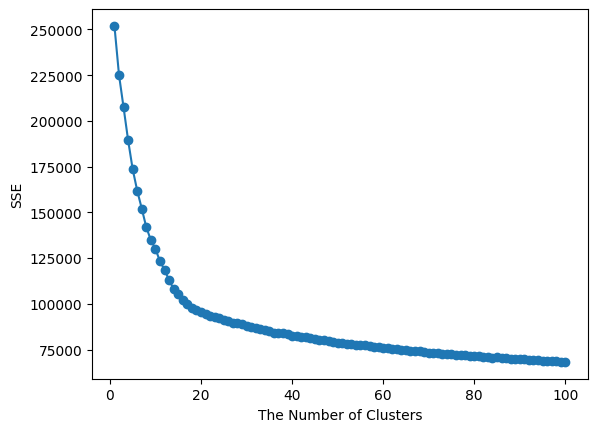

[251905.01238156806, 225098.73437144945, 207410.5312449981, 189422.34541667142, 173614.36708075448, 161837.04087876563, 152041.47615805035, 141781.02069927653, 134813.92042456637, 130046.83726057052, 123194.22315905616, 118637.70976109433, 112787.94720866269, 108295.25255694156, 105172.57146926665, 102229.27436591717, 99670.25768707252, 97628.12616779169, 96559.94398789044, 95515.47209610404, 94596.96134757804, 93613.45967211247, 93007.46886699804, 92264.57142399278, 91425.5917117116, 90602.55128880247, 89736.8922473597, 89273.01441350213, 88839.90771296986, 87755.710915939, 87252.67479184015, 87022.96913320274, 86042.64397756584, 85814.86350344834, 85224.09114663201, 84268.40668132821, 84162.83019309465, 83970.82187963885, 83253.94266469187, 82579.81601132732, 82157.01889266251, 81992.30722442531, 81736.51757900929, 81170.59135639362, 80865.57181967363, 80083.00666632992, 80088.96779395349, 79755.3669255654, 79246.39337919775, 78817.931991052, 78471.94078206246, 78251.73278071349, 778

In [9]:
import matplotlib.pyplot as plt
def elbow(df):
    sse=[]
    for i in range(1, 101):
        km=KMeans(n_clusters=i, random_state=1)
        km.fit(df)
        sse.append(km.inertia_)

    plt.plot(range(1,101), sse, marker='o')
    plt.xlabel('The Number of Clusters')
    plt.ylabel('SSE')
    plt.show()
    print(sse)

elbow(df)

In [10]:
km = KMeans(n_clusters=18, random_state=1)
km.fit(df)
new_labels = km.labels_
df['cluster'] = new_labels

df.groupby(['cluster']).mean()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,시비르,리븐,쉔,탐 켄치,갈리오,카이사,사일러스,우디르,케일,케이틀린,...,신드라,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.023364,0.004673,0.004673,0.004673,0.032710,0.264019,0.000000,0.051402,...,1.602804,0.000000,0.976636,1.537383,2.051402,0.007009,0.009346,0.002336,0.000000,0.000000
1,1.785714,1.876623,0.001623,2.668831,0.185065,0.047078,0.066558,0.029221,0.987013,0.000000,...,0.000000,0.012987,0.000000,0.000000,0.001623,0.030844,0.021104,0.011364,0.040584,0.004870
2,0.060921,1.523031,0.014859,0.028232,1.567608,0.053492,0.074294,0.334324,0.921248,0.000000,...,0.000000,0.005944,0.000000,0.002972,0.019316,0.002972,0.010401,0.034175,0.017831,0.013373
3,0.012500,0.028125,1.621875,0.018750,0.137500,0.396875,0.703125,0.518750,0.012500,0.787500,...,0.040625,0.009375,0.012500,0.025000,0.096875,0.031250,0.046875,0.012500,0.025000,0.078125
4,0.010676,0.080071,0.023132,1.064057,0.140569,0.019573,0.754448,0.297153,0.014235,0.003559,...,0.021352,0.030249,0.000000,0.008897,0.012456,0.259786,0.014235,0.003559,0.007117,0.007117
5,0.106287,0.236527,0.187126,0.134731,0.339820,0.330838,0.414671,0.534431,0.113772,0.043413,...,0.166168,0.091317,0.031437,0.070359,0.263473,0.071856,0.109281,0.056886,0.088323,0.085329
6,0.017094,0.116809,0.034188,0.022792,0.045584,0.011396,0.079772,0.364672,0.019943,0.008547,...,0.025641,0.008547,0.025641,0.000000,0.011396,0.025641,1.564103,0.011396,0.000000,0.011396
7,0.006494,0.038961,0.139610,0.019481,0.012987,0.100649,0.045455,0.220779,0.000000,1.613636,...,0.009740,0.009740,0.000000,0.022727,0.012987,0.000000,0.003247,0.009740,0.003247,0.016234
8,0.000000,0.015075,0.005025,0.000000,0.007538,0.007538,0.035176,0.052764,0.002513,0.000000,...,0.002513,0.000000,1.379397,0.020101,0.017588,0.000000,0.012563,0.000000,0.000000,0.002513


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df,
             diag_kind='kde',
             hue="cluster",
             corner=True,
             palette='bright')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 47476 (\N{HANGUL SYLLABLE REU}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 48656 (\N{HANGUL SYLLABLE BEUN}) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:12

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df,
             diag_kind='kde',
             hue="cluster",
             corner =True,
             palette='bright')
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48656 (\N{HANGUL SYLLABLE BEUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49748 (\N{HANGUL SYLLABLE SWEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 53456 (\N{HANGUL SYLLABLE TAM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52996 (\N{HANGUL SYLLABLE KEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages